In [1]:
import os
import torch
import random

from PIL import Image
from tqdm import tqdm

from diffusers import StableDiffusionXLPipeline
from ip_adapter import IPAdapterXL

from IPython.display import display


### sdxl
base_model_path = "stabilityai/stable-diffusion-xl-base-1.0"
# image_encoder_path = "sdxl_models/image_encoder"
# ip_ckpt = "sdxl_models/ip-adapter_sdxl.bin"
image_encoder_path = "models/image_encoder"
ip_ckpt = "sdxl_models/ip-adapter_sdxl_vit-h.bin"
device = "cuda"

### sd multimodal
# base_model_path = "SG161222/Realistic_Vision_V4.0_noVAE"
# vae_model_path = "stabilityai/sd-vae-ft-mse"
# image_encoder_path = "models/image_encoder/"
# ip_ckpt = "models/ip-adapter_sd15.bin"
# device = "cuda"

pascal_images_root_path = 'VOCdevkit/VOC2012/JPEGImages'

num_samples = 2

/home/ydseo/miniconda3/envs/ipa/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [3]:
def display_images(imgs, size):
    images = (img.resize((size, size)) for img in imgs)
    for img in images:
        display(img)

In [4]:
pipe = StableDiffusionXLPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    add_watermarker=False,
)

ip_model = IPAdapterXL(pipe, image_encoder_path, ip_ckpt, device)

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]


In [5]:
images_list = sorted([pascal_images_root_path + '/' + path for path in os.listdir(pascal_images_root_path)])
len(images_list)

17125

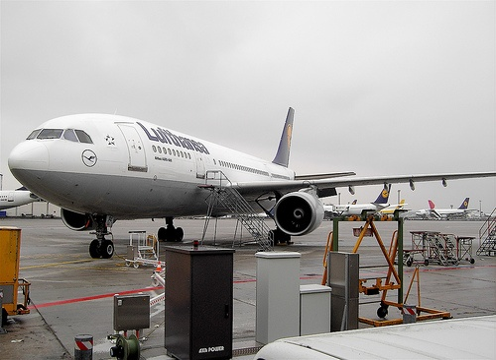

In [6]:
index = 2

image = Image.open(images_list[index])

## resize to (max_size, max_size)
# min_size = min(image.width, image.height)
# max_size = max(image.width, image.height)
# image = image.resize((max_size, max_size))

resized_width, resized_height = image.width - (image.width % 8), image.height - (image.height % 8)

image = image.resize((resized_width, resized_height))
image.resize((resized_width, resized_height))

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:12<00:00,  2.47it/s]


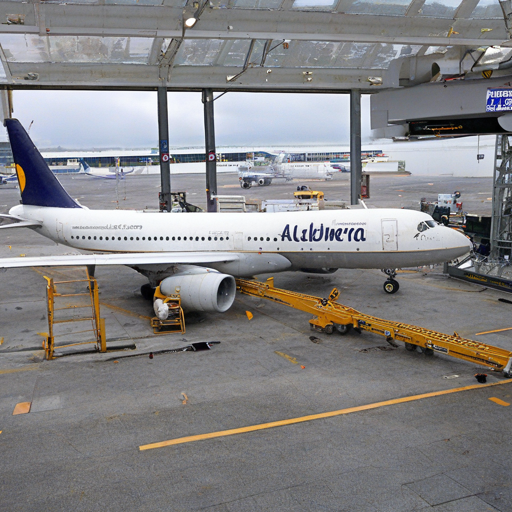

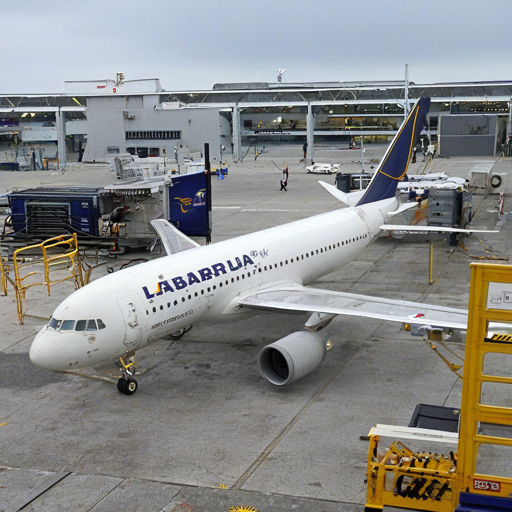

In [7]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=42421)
display_images(images, 512)

 13%|█▎        | 4/30 [00:01<00:10,  2.46it/s]

100%|██████████| 30/30 [00:12<00:00,  2.46it/s]


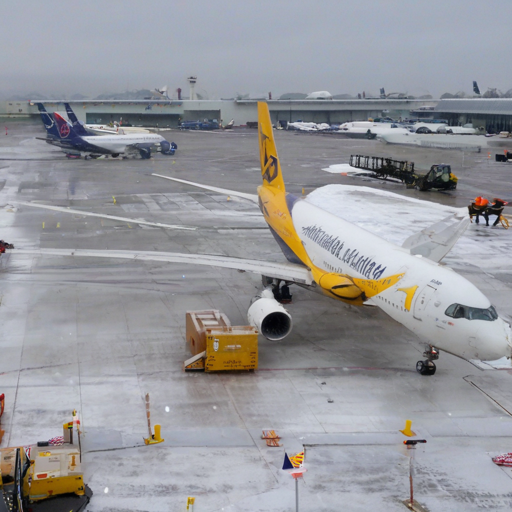

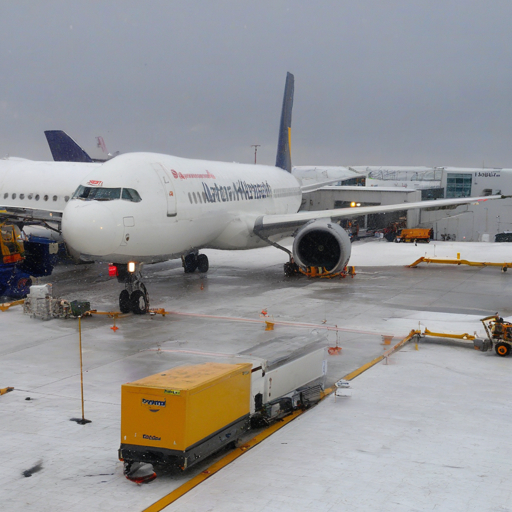

In [8]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=4231729122, prompt="best quality, high quality, waiting to take off in snowing weather", scale=0.5)
display_images(images, 512)

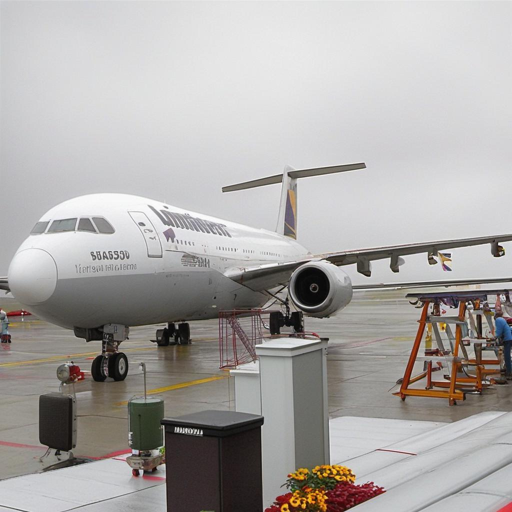

In [9]:
### generted by plus_sdxl
image = Image.open('plus_sdxl_0.jpg')
# image = Image.open('plus_sdxl_1.jpg')
image.resize((512, 512))

 10%|█         | 3/30 [00:01<00:10,  2.49it/s]

100%|██████████| 30/30 [00:12<00:00,  2.48it/s]


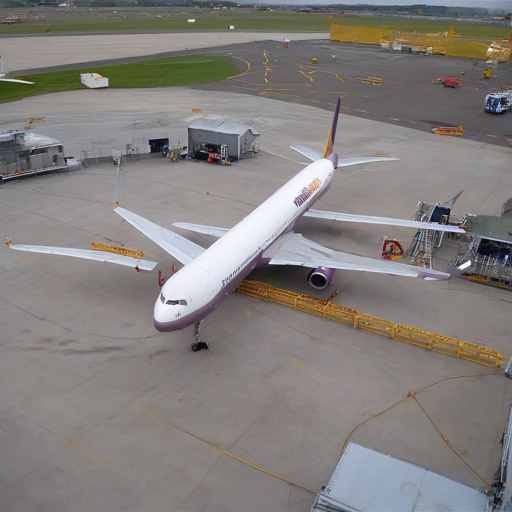

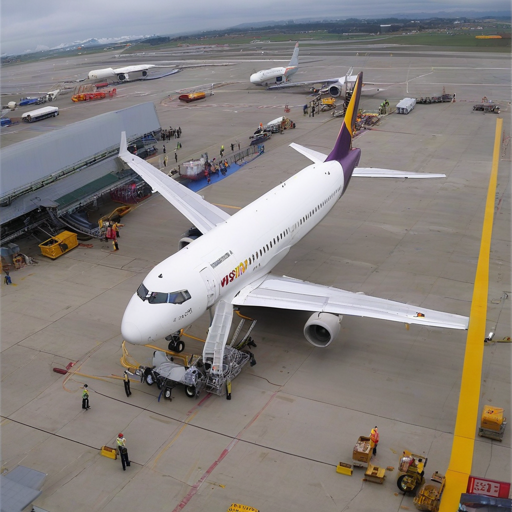

In [11]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=42421, prompt="best quality, high quality, top view, waiting to take off in clear weather", scale=0.6)
display_images(images, 512)

---
# chair

500 290


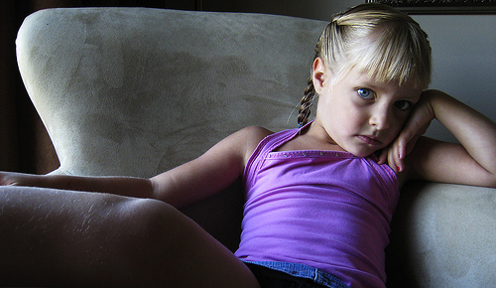

In [12]:
image = Image.open('VOCdevkit/VOC2012/JPEGImages/2011_002709.jpg')

## resize to (max_size, max_size)
# min_size = min(image.width, image.height)
# max_size = max(image.width, image.height)
# image = image.resize((max_size, max_size))

resized_width, resized_height = image.width - (image.width % 8), image.height - (image.height % 8)

print(image.width, image.height)

image = image.resize((resized_width, resized_height))
image.resize((resized_width, resized_height))

  3%|▎         | 1/30 [00:00<00:11,  2.44it/s]

100%|██████████| 30/30 [00:12<00:00,  2.47it/s]


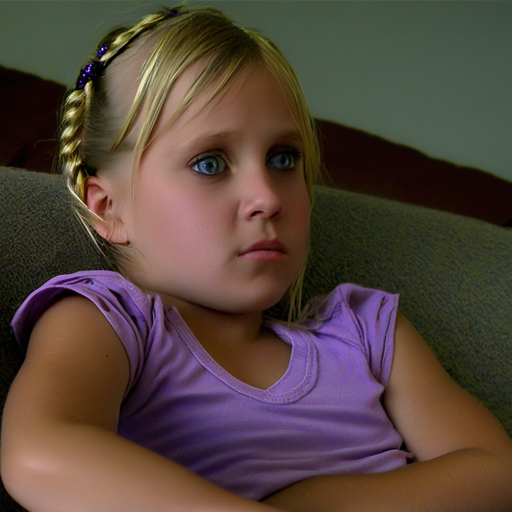

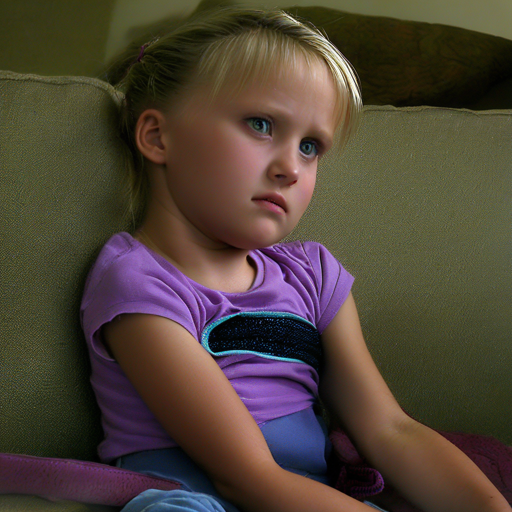

In [13]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=42422441)
display_images(images, 512)

  3%|▎         | 1/30 [00:00<00:11,  2.44it/s]

100%|██████████| 30/30 [00:12<00:00,  2.47it/s]


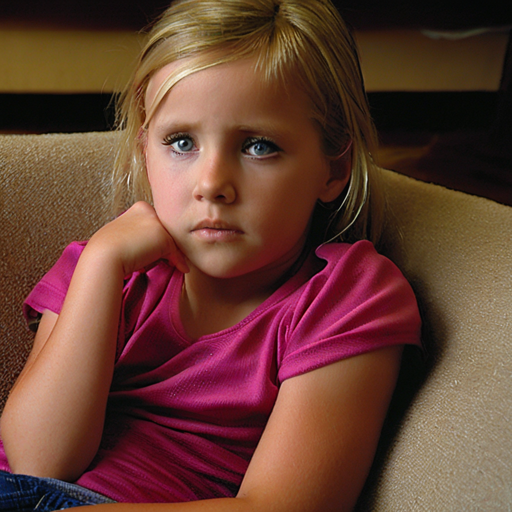

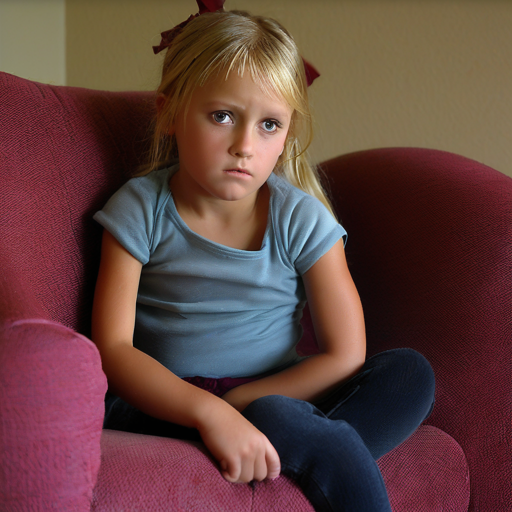

In [14]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=424, prompt="best quality, high quality, a red chair", scale=0.5)
display_images(images, 512)

500 375


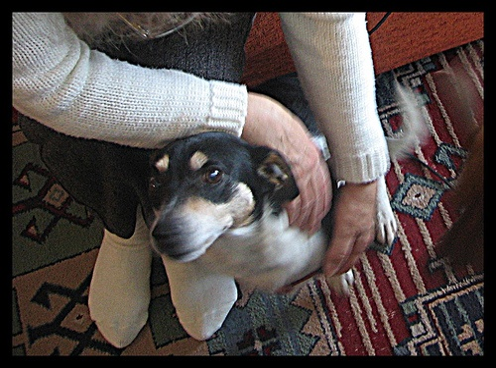

In [15]:
image = Image.open('VOCdevkit/VOC2012/JPEGImages/2007_002611.jpg')

## resize to (max_size, max_size)
# min_size = min(image.width, image.height)
# max_size = max(image.width, image.height)
# image = image.resize((max_size, max_size))

resized_width, resized_height = image.width - (image.width % 8), image.height - (image.height % 8)

print(image.width, image.height)

image = image.resize((resized_width, resized_height))
image.resize((resized_width, resized_height))

 13%|█▎        | 4/30 [00:01<00:10,  2.45it/s]

100%|██████████| 30/30 [00:12<00:00,  2.47it/s]


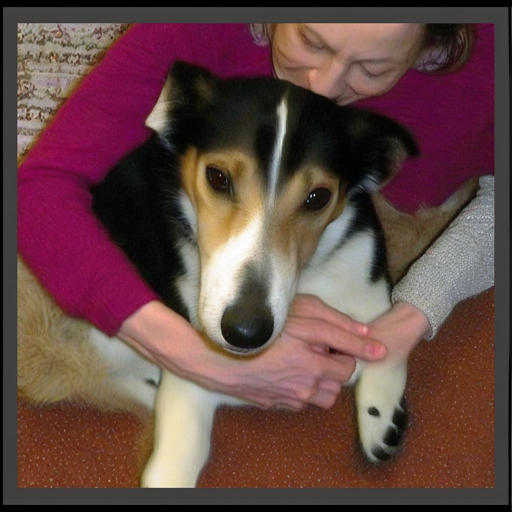

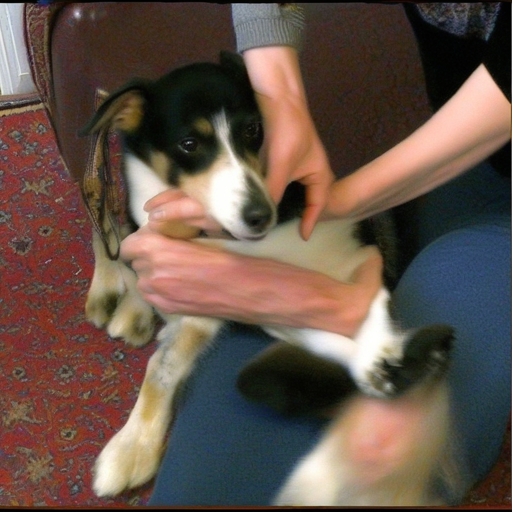

In [16]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=442425)
display_images(images, 512)

  7%|▋         | 2/30 [00:00<00:11,  2.46it/s]

100%|██████████| 30/30 [00:12<00:00,  2.47it/s]


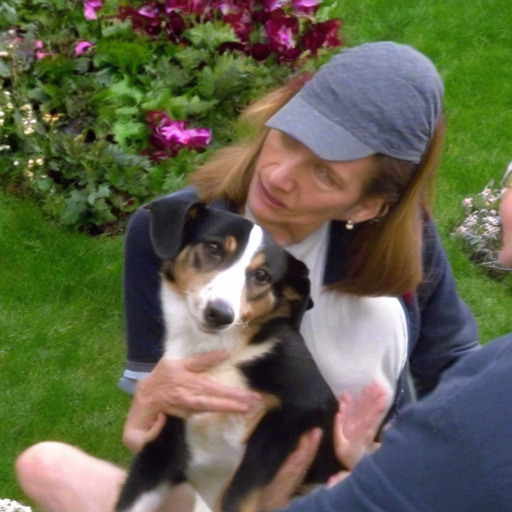

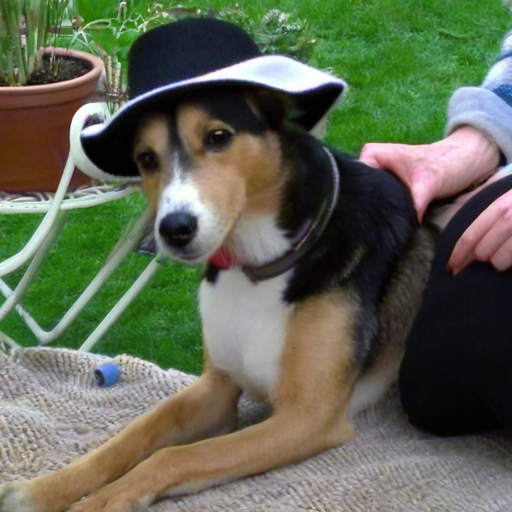

In [17]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=442175, prompt="best quality, high quality, wearing a hat in a garden", scale=0.5)
display_images(images, 512)

500 375


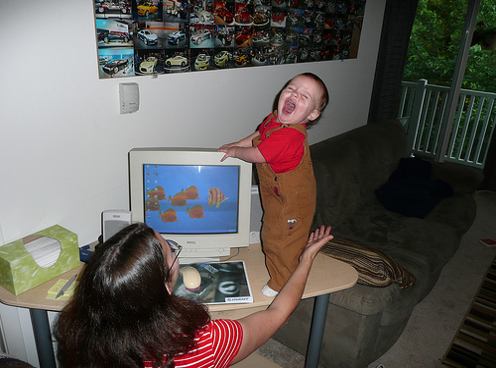

In [18]:
image = Image.open('VOCdevkit/VOC2012/JPEGImages/2009_004301.jpg')

## resize to (max_size, max_size)
# min_size = min(image.width, image.height)
# max_size = max(image.width, image.height)
# image = image.resize((max_size, max_size))

resized_width, resized_height = image.width - (image.width % 8), image.height - (image.height % 8)

print(image.width, image.height)

image = image.resize((resized_width, resized_height))
image.resize((resized_width, resized_height))

 10%|█         | 3/30 [00:01<00:10,  2.50it/s]

100%|██████████| 30/30 [00:12<00:00,  2.50it/s]


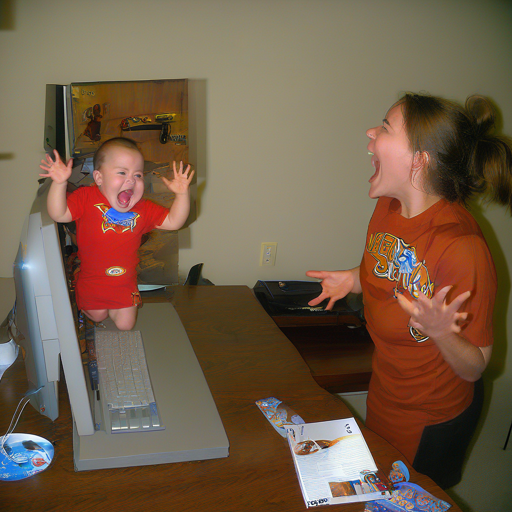

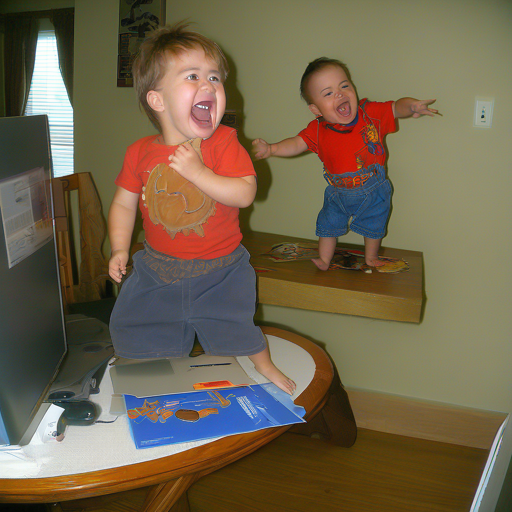

In [19]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=442)
display_images(images, 512)

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:12<00:00,  2.48it/s]


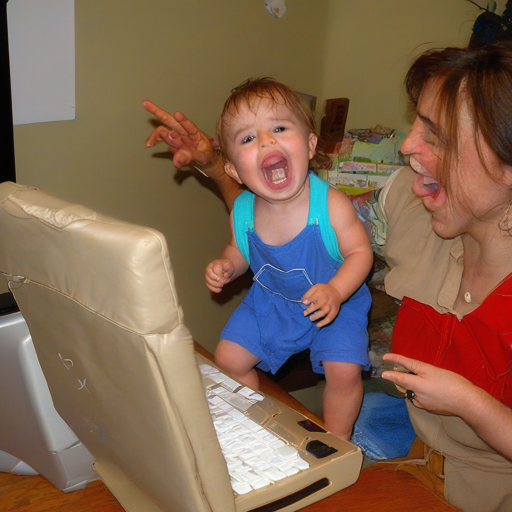

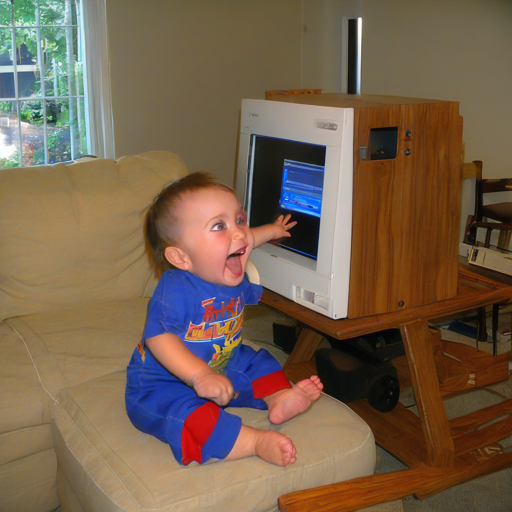

In [20]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=44217115, prompt="best quality, high quality, a blue sofa", scale=0.5)
display_images(images, 512)

500 333


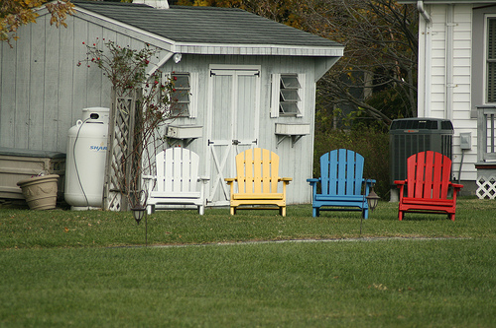

In [21]:
image = Image.open('VOCdevkit/VOC2012/JPEGImages/2009_000028.jpg')

## resize to (max_size, max_size)
# min_size = min(image.width, image.height)
# max_size = max(image.width, image.height)
# image = image.resize((max_size, max_size))

resized_width, resized_height = image.width - (image.width % 8), image.height - (image.height % 8)

print(image.width, image.height)

image = image.resize((resized_width, resized_height))
image.resize((resized_width, resized_height))

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:11<00:00,  2.50it/s]


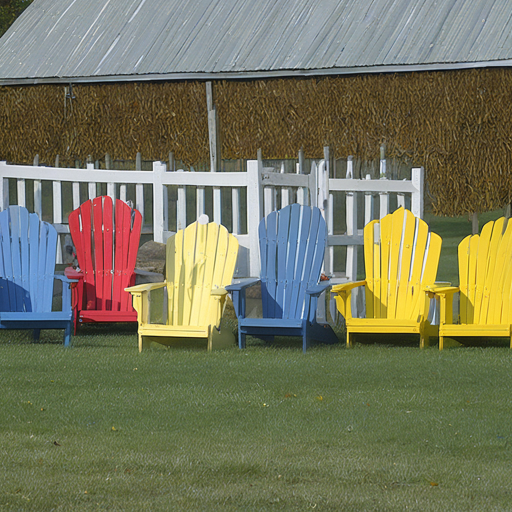

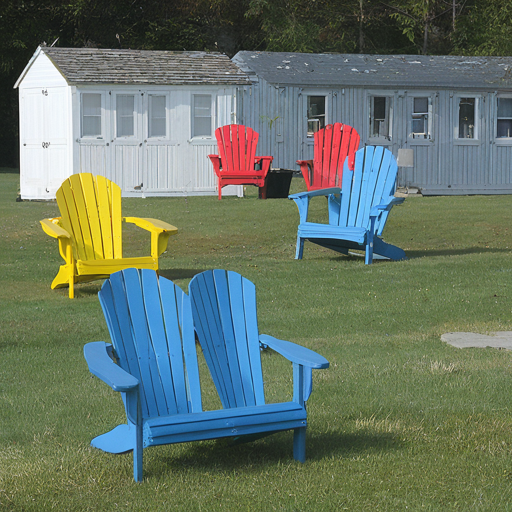

In [22]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=442)
display_images(images, 512)

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:12<00:00,  2.48it/s]


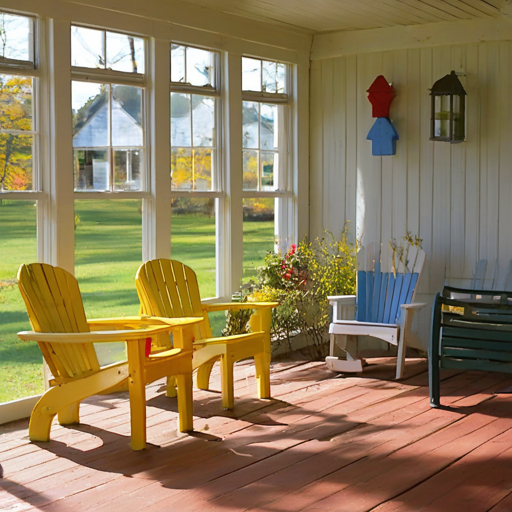

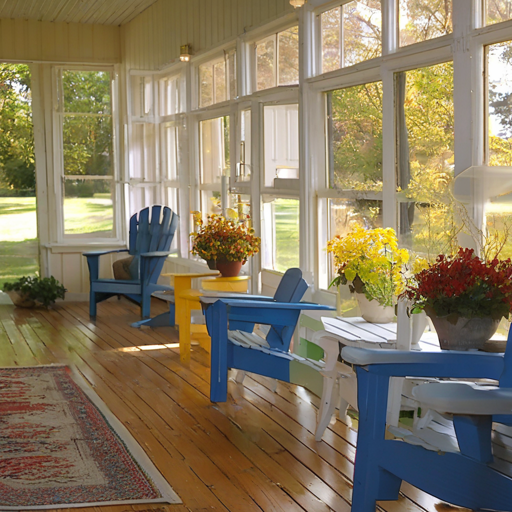

In [23]:
images = ip_model.generate(pil_image=image, num_samples=num_samples, num_inference_steps=30, seed=44221, prompt="best quality, high quality, A cozy living room bathed in the gentle glow of the afternoon sun, which streams in through large windows draped with light, airy curtains.", scale=0.4)
display_images(images, 512)